<p style='text-align: justify;'><font size=4>Esta implementação é baseada em: <i>Fitz Gerald, D.; Gainza, M. Single Channel Vocal Separation using Median Filtering and Factorisation Techniques. Audio Research Group, Dublin Institute of Tecnology, Kevin St, Dublin, Ireland.

<img src="diagram.png">

## Libraries

In [1]:
import os
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import librosa

import librosa.display
import IPython.display as ipd
from scipy.signal import find_peaks

## Import Audio

In [2]:
y, sr = librosa.load('../Audio/The Beach Boys [Pet Sounds] - Sloop John B (Stereo Remaster).mp3', duration = 30)

/home/laset/.local/lib/python3.7/site-packages/librosa/core/audio.py:146: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


## Play Audio

In [3]:
ipd.Audio(y, rate=sr)

## STFT - High

In [4]:
D = librosa.stft(y)

/home/laset/.local/lib/python3.7/site-packages/librosa/core/spectrum.py:1700: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


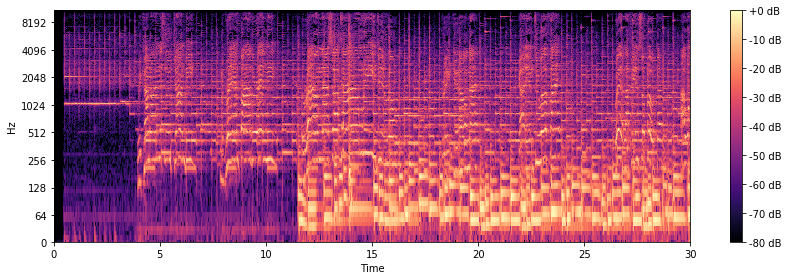

In [5]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

## Median filter

## $$ D = D_{harmonic} + D_{percussive} $$

In [6]:
D_harmonic, D_percussive = librosa.decompose.hpss(D, kernel_size = (17, 17))

## Create Masks and Filtering

$$ M_{harmonic}=\frac{D_{harmonic}^2}{D_{harmonic}^2+D_{percussive}^2} $$
$$ M_{percussive}=\frac{D_{percussive}^2}{D_{percussive}^2+D_{harmonic}^2} $$

$$ H = D\otimes M_{harmonic} $$
$$ P = D\otimes M_{percussive} $$

In [7]:
power = 2

mask_harmonic = librosa.util.softmask(np.abs(D_harmonic), np.abs(D_percussive), power = power)
mask_percussive = librosa.util.softmask(np.abs(D_percussive), np.abs(D_harmonic), power = power)

S_harmonic = mask_harmonic*D
S_percussive = mask_percussive*D

## Spectogram

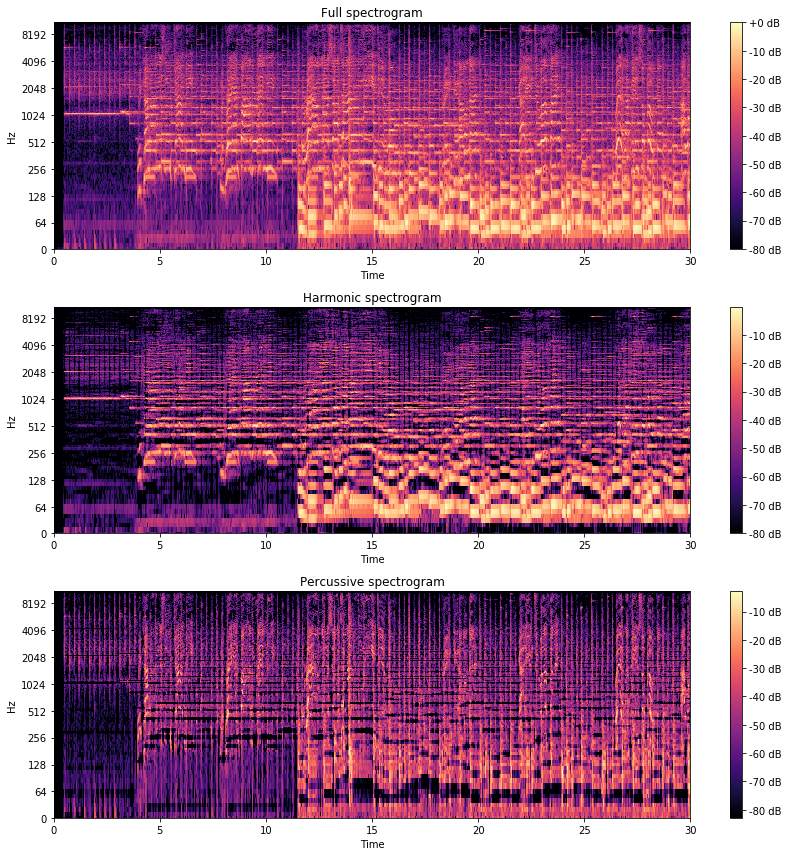

In [8]:
ref = np.max(np.abs(D))

plt.figure(figsize=(12, 12))

ax = [1, 2, 3]

specs = [D, S_harmonic, S_percussive]

titles = ['Full spectrogram', 'Harmonic spectrogram', 'Percussive spectrogram']

for axi, spec, title in zip(ax, specs, titles):
    plt.subplot(3, 1, axi)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(spec), ref=ref), y_axis='log', x_axis = 'time')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()

## Play Audios

In [9]:
y_harmonic = librosa.istft(S_harmonic)
y_percussive = librosa.istft(S_percussive)

In [10]:
ipd.Audio(y_harmonic, rate = sr)

In [11]:
ipd.Audio(y_percussive, rate = sr)

## STFT - Low

In [12]:
L = librosa.stft(y_percussive, n_fft = 1024, hop_length = 256)

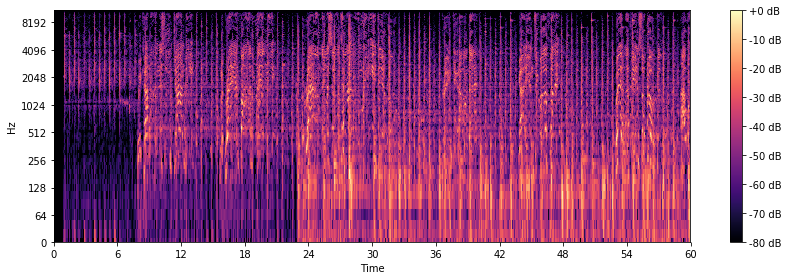

In [13]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(L, ref=np.max),y_axis='log', x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

## Median Filter

In [14]:
L_harmonic, L_percussive = librosa.decompose.hpss(L, kernel_size = (17, 17))

## Create a Mask and Filter

In [15]:
power = 2

mask_voice = librosa.util.softmask(np.abs(L_harmonic), np.abs(L_percussive), power = power)
mask_percussive_L = librosa.util.softmask(np.abs(L_percussive), np.abs(L_harmonic), power = power)

S_voice = mask_voice*L
S2_percussive = mask_percussive_L*L

## Spectogram

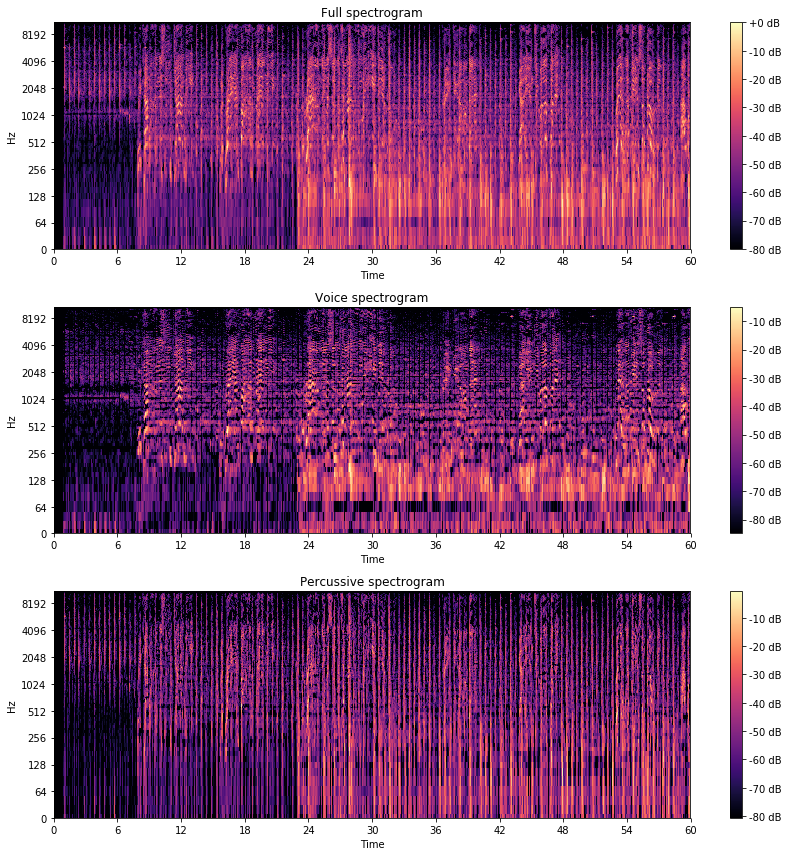

In [16]:
ref = np.max(np.abs(L))

plt.figure(figsize=(12, 12))

ax = [1, 2, 3]

specs = [L, S_voice, S2_percussive]

titles = ['Full spectrogram', 'Voice spectrogram', 'Percussive spectrogram']

for axi, spec, title in zip(ax, specs, titles):
    plt.subplot(3, 1, axi)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(spec), ref=ref), y_axis='log', x_axis = 'time')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()

## Play Audios

In [17]:
y_voice = librosa.istft(S_voice)
y2_percussive = librosa.istft(S2_percussive)

In [18]:
ipd.Audio(y_voice, rate=sr)

In [19]:
ipd.Audio(y2_percussive, rate=sr)

## Pitch modification

In [20]:
pitches, magnitudes = librosa.core.piptrack(y=y_voice, sr=sr, fmin=75, fmax=1600)

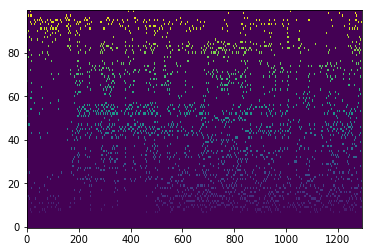

In [21]:
plt.imshow(pitches[:100, :], aspect="auto", interpolation="nearest", origin="bottom");

In [22]:
shifted = librosa.effects.pitch_shift(y=y_voice, sr=sr, n_steps=-3)

In [23]:
ipd.Audio(shifted, rate=sr)

In [24]:
pitches_shifted, magnitudes_shifted = librosa.core.piptrack(y=shifted, sr=sr, fmin=75, fmax=1600)

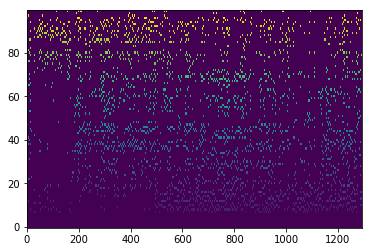

In [25]:
plt.imshow(pitches_shifted[:100, :], aspect="auto", interpolation="nearest", origin="bottom");